<a href="https://colab.research.google.com/github/TakumiML/ozone/blob/main/ozone2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 時系列データを1つの特徴量にする

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!pip install tslearn

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 374.4/374.4 kB 5.8 MB/s eta 0:00:00


In [ ]:
!pip install Cython

In [ ]:
!pip install torch torchvision

  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl (731.7 MB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl (410.6 MB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl (121.6 MB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl (56.5 MB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl (124.2 MB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl (196.0 MB)
  Using cached nvidia_nccl_cu12-2.19.3-py3-none-manylinux1_x86_64.whl (166.0 MB)
  Using cached nvidia_nvtx_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (99 kB)
  Using cached nvidia_nvjitlink_cu12-12.4.127-py3-none-m

In [ ]:
import pandas as pd
import numpy as np


train = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/ozon/train.tsv', sep='\t', index_col=0 )
test  = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/ozon/test.tsv', sep='\t', index_col=0)
sample  = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/ozon/sample_submit.csv',header=None)

In [ ]:
train

,Date,WSR0,WSR1,WSR2,WSR3,WSR4,WSR5,WSR6,WSR7,WSR8,...,RH50,U50,V50,HT50,KI,TT,SLP,SLP_,Precp,OZONE
id,,,,,,,,,,,,,,,,,,,,,
0,1998/1/1,0.8,1.8,2.4,2.1,2.0,2.1,1.5,1.7,1.9,...,0.15,10.67,-1.56,5795.0,-12.10,17.90,10330.0,-55.0,0.00,0
1,1998/1/2,2.8,3.2,3.3,2.7,3.3,3.2,2.9,2.8,3.1,...,0.48,8.39,3.84,5805.0,14.05,29.00,10275.0,-55.0,0.00,0
2,1998/1/3,2.9,2.8,2.6,2.1,2.2,2.5,2.5,2.7,2.2,...,0.60,6.94,9.80,5790.0,17.90,41.30,10235.0,-40.0,0.00,0
3,1998/1/4,4.7,3.8,3.7,3.8,2.9,3.1,2.8,2.5,2.4,...,0.49,8.73,10.54,5775.0,31.15,51.70,10195.0,-40.0,2.08,0
4,1998/1/5,2.6,2.1,1.6,1.4,0.9,1.5,1.2,1.4,1.3,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.58,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1262,2001/6/29,0.8,0.9,0.3,0.3,0.7,0.8,1.3,1.9,3.0,...,0.45,8.65,-1.27,5870.0,27.80,44.80,10190.0,-25.0,0.05,0
1263,2001/6/30,1.0,0.7,0.8,0.6,0.9,1.2,1.3,1.7,2.8,...,0.65,5.38,2.00,5850.0,35.60,49.60,10175.0,-15.0,0.18,0
1264,2001/7/1,0.7,1.0,1.4,0.9,1.0,1.2,1.4,1.4,1.1,...,0.22,2.29,4.09,5855.0,32.10,48.20,10155.0,-20.0,0.23,0


In [ ]:
test

,Date,WSR0,WSR1,WSR2,WSR3,WSR4,WSR5,WSR6,WSR7,WSR8,...,T50,RH50,U50,V50,HT50,KI,TT,SLP,SLP_,Precp
id,,,,,,,,,,,,,,,,,,,,,
1267,2001/7/4,0.5,0.1,0.5,1.3,1.2,0.9,1.0,0.8,0.7,...,-8.3,0.75,4.63,3.24,5915.0,34.10,46.45,10200.0,10.0,0.08
1268,2001/7/5,0.5,0.3,0.6,0.3,0.4,0.4,0.8,2.4,3.4,...,-8.5,0.82,2.33,-3.81,5915.0,33.70,48.20,10180.0,-20.0,0.00
1269,2001/7/6,1.2,0.8,0.7,0.9,0.4,0.1,0.4,1.6,2.8,...,-7.5,0.45,-1.07,-4.16,5910.0,36.45,49.25,10165.0,-15.0,0.00
1270,2001/7/7,1.2,0.7,1.1,0.7,0.4,0.2,0.5,0.7,0.9,...,-7.0,0.40,-9.62,-1.64,5915.0,32.55,44.50,10175.0,10.0,0.00
1271,2001/7/8,0.9,0.4,0.3,0.1,0.2,0.2,0.0,1.3,1.4,...,-5.4,0.03,-8.19,0.97,5935.0,28.20,41.10,10180.0,5.0,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2529,2004/12/27,0.3,0.4,0.5,0.5,0.2,0.3,0.4,0.4,1.3,...,-12.4,0.07,7.93,-4.41,5800.0,-25.60,21.80,10295.0,65.0,0.00
2530,2004/12/28,1.0,1.4,1.1,1.7,1.5,1.7,1.8,1.5,2.1,...,-12.0,0.04,5.95,-1.14,5845.0,-19.40,19.10,10310.0,15.0,0.00
2531,2004/12/29,0.8,0.8,1.2,0.9,0.4,0.6,0.8,1.1,1.5,...,-11.8,0.06,7.80,-0.64,5845.0,-9.60,35.20,10275.0,-35.0,0.00


In [ ]:
wsr = ['WSR0', 'WSR1','WSR2','WSR3','WSR4','WSR4','WSR5','WSR6','WSR7','WSR8','WSR9','WSR10','WSR11','WSR12','WSR13','WSR14','WSR15','WSR16','WSR17','WSR18','WSR19','WSR20','WSR21','WSR22','WSR23']

In [ ]:
WSR = pd.concat((train[wsr], test[wsr]), axis=0)

In [ ]:
WSR = WSR.fillna(0)

In [ ]:
WSR.columns.tolist()

['WSR0',
 'WSR1',
 'WSR2',
 'WSR3',
 'WSR4',
 'WSR4',
 'WSR5',
 'WSR6',
 'WSR7',
 'WSR8',
 'WSR9',
 'WSR10',
 'WSR11',
 'WSR12',
 'WSR13',
 'WSR14',
 'WSR15',
 'WSR16',
 'WSR17',
 'WSR18',
 'WSR19',
 'WSR20',
 'WSR21',
 'WSR22',
 'WSR23']

# 時系列クラスタリングを試す

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import warnings
from tslearn.clustering import TimeSeriesKMeans
from tslearn.utils import to_time_series_dataset
from tslearn.preprocessing import TimeSeriesScalerMeanVariance

In [ ]:
time_np = to_time_series_dataset(WSR)

fig, ax = plt.subplots(figsize=(20,8))

for i, x in enumerate(time_np[:]):
    ax.plot(x, label='shop'+str(i))

ax.legend(loc='upper left', bbox_to_anchor=(1.05, 1))
plt.show()

/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 12456 (\N{KATAKANA LETTER E}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 12523 (\N{KATAKANA LETTER RU}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 12508 (\N{KATAKANA LETTER BO}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 12540 (\N{KATAKANA-HIRAGANA PROLONGED SOUND MARK}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 27861 (\N{CJK UNIFIED IDEOGRAPH-6CD5}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/pyt

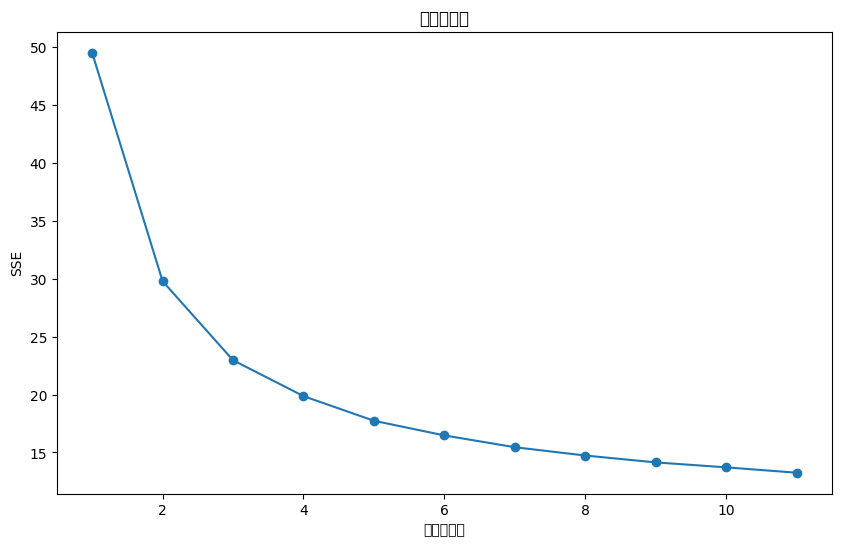

In [ ]:
inertia = []
for n_clusters in range(1,12):
    km = TimeSeriesKMeans(n_clusters=n_clusters, metric='euclidean', random_state=0)
    km.fit(time_np)
    inertia.append(km.inertia_)

plt.figure(figsize=(10, 6))
plt.plot(range(1,12), inertia, marker='o')
plt.xlabel('クラスタ数')
plt.ylabel('SSE')
plt.title('エルボー法')
plt.show()

[6 7 6 ... 5 3 6]


/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 26178 (\N{CJK UNIFIED IDEOGRAPH-6642}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 31995 (\N{CJK UNIFIED IDEOGRAPH-7CFB}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 21015 (\N{CJK UNIFIED IDEOGRAPH-5217}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 12463 (\N{KATAKANA LETTER KU}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 12521 (\N{KATAKANA LETTER RA}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python

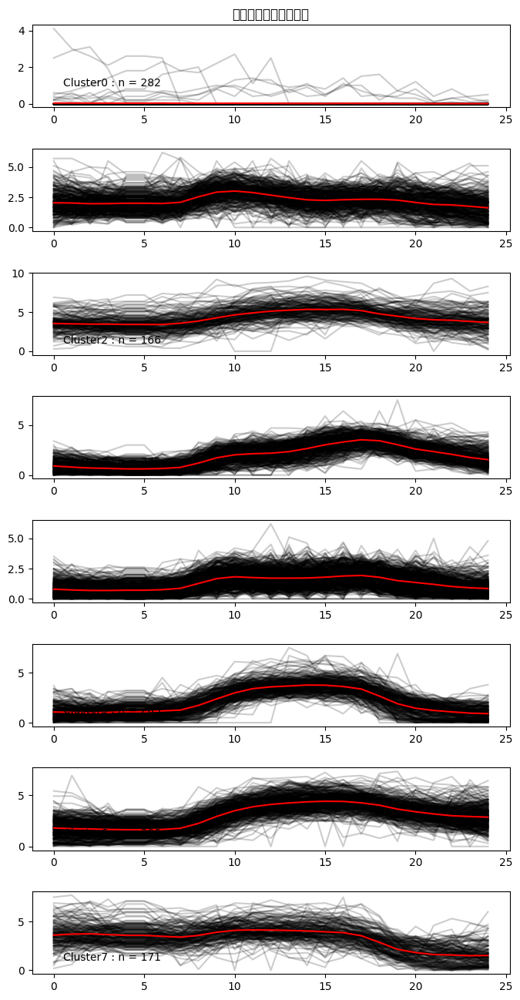

In [ ]:
n = 8
km_euclidean = TimeSeriesKMeans(n_clusters=n, metric='euclidean', random_state=0)
labels_euclidean = km_euclidean.fit_predict(time_np)
print(labels_euclidean)

fig, axes = plt.subplots(n, figsize=(8,16))
plt.subplots_adjust(hspace=0.5)
for i in range(n):
    ax = axes[i]

    for x in time_np[labels_euclidean == i]:
        ax.plot(x.ravel(), 'k-', alpha=0.2)
    ax.plot(km_euclidean.cluster_centers_[i].ravel(), 'r-')

    datanum = np.count_nonzero(labels_euclidean == i)
    ax.text(0.5, (0.7+0.25), f'Cluster{(i)} : n = {datanum}')
    if i == 0:
        ax.set_title('時系列クラスタリング')
plt.show()

In [ ]:
n = 4
km_euclidean = TimeSeriesKMeans(n_clusters=n, metric='euclidean', random_state=0)
labels_euclidean = km_euclidean.fit_predict(WSR)
print(labels_euclidean)

colors = pd.DataFrame(labels_euclidean).replace({0:'r', 1:'b', 2:'g', 3:'black'})

fig = plt.figure(figsize=(20,8))
index = 0
for shop in WSR.T.columns:
    plt.plot(WSR.T.index, WSR.T[shop], label='shop'+str(shop)+'cluster'+str(labels_euclidean[index]), color=colors[0][index])
    index += 1
plt.legend(loc='upper left', bbox_to_anchor=(1.05, 1))
plt.title('時系列クラスタリング')
plt.show()
#[2 2 2 2 0 0 3 0 2 2 2 2 0 2 0 0 0 2 0 0 2 0 0 2 0 1 0 3 1 0 0 1 2 2 2 0 2
# 0 0 2 2 0 3 0 0 0 0 0 2 2 0 0 0 0 1 0 0 3 0 0]


[2 3 3 ... 1 2 2]


/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 26178 (\N{CJK UNIFIED IDEOGRAPH-6642}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 31995 (\N{CJK UNIFIED IDEOGRAPH-7CFB}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 21015 (\N{CJK UNIFIED IDEOGRAPH-5217}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 12463 (\N{KATAKANA LETTER KU}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 12521 (\N{KATAKANA LETTER RA}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python